<a href="https://colab.research.google.com/github/aniket15031998/Mobile-price-range-classification/blob/main/Capstone_3_Mobile_Price_Range_Classification_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - Mobile Price Range Prediction



##### **Project Type**    - Classification
##### **Contribution**    - Team
##### **Team Member 1 -** Vinayak Gunjal
##### **Team Member 2 -** Nikhil Prediction
##### **Team Member 3 -** Aniket Kale

# **Project Summary -**

The project's goal is to group mobile phones according to their characteristics and pricing points. On a dataset that includes information on mobile phone specs like RAM, storage, camera quality, display, and battery capacity, classification will be carried out using machine learning methods. To create a precise and effective classification model, the project will include feature engineering, model selection, and data preparation. A mobile pricing range prediction model will be the project's ultimate deliverable, and it will be useful for customers, merchants, and makers of mobile phones in making decisions.



# **GitHub Link -**

Provide your GitHub Link here.

# **Problem Statement**


Building a machine learning model that properly predicts the price range of a mobile phone based on its features is the problem statement for mobile price range classification. The model must to be precise, effective, and scalable to deal with a lot of data. To create a useful price range categorization system, the project will include feature engineering, model selection, and data preparation.

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn import ensemble

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, roc_auc_score

from sklearn.ensemble import GradientBoostingClassifier

from sklearn.neighbors import KNeighborsClassifier

from sklearn.linear_model import LogisticRegression

### Dataset Loading

In [ ]:
# Load Dataset
m_data=pd.read_csv("/content/data_mobile_price_range.csv")

### Dataset First View

In [ ]:
# Dataset First Look
m_data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
m_data.shape

(2000, 21)

### Dataset Information

In [ ]:
# Dataset Info
m_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
m_data.duplicated().sum()

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
m_data.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

### What did you know about your dataset?

Our data has 2000 rows and 21 columns having zero null columns in it.

## ***2. Understanding Your Variables***

In [ ]:
# Dataset Columns
m_data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
# Dataset Describe
m_data.describe(include='all')

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


### Variables Description 

1. Battery Power in mAh

2. Has BlueTooth or not

3. Microprocessor clock speed

4. The phone has dual sim support or not

5. Front Camera Megapixels

6. Has 4G support or not

7. Internal Memory in GigaBytes

8. Mobile Depth in Cm

9. Weight of Mobile Phone

10. Number of cores in the processor

11. Primary Camera Megapixels

12. Pixel Resolution height

13. Pixel resolution width

14. RAM in MB

15. Mobile screen height in cm

16. Mobile screen width in cm

17. Longest time after a single charge

18. 3g or not

19. Has touch screen or not

20. 
Has wifi or not



### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
for i in m_data.describe(include='all').columns:
  print(f'Unique values for {i} ',m_data[i].unique())

Unique values for battery_power  [ 842 1021  563 ... 1139 1467  858]
Unique values for blue  [0 1]
Unique values for clock_speed  [2.2 0.5 2.5 1.2 1.7 0.6 2.9 2.8 2.1 1.  0.9 1.1 2.6 1.4 1.6 2.7 1.3 2.3
 2.  1.8 3.  1.5 1.9 2.4 0.8 0.7]
Unique values for dual_sim  [0 1]
Unique values for fc  [ 1  0  2 13  3  4  5  7 11 12 16  6 15  8  9 10 18 17 14 19]
Unique values for four_g  [0 1]
Unique values for int_memory  [ 7 53 41 10 44 22 24  9 33 17 52 46 13 23 49 19 39 47 38  8 57 51 21  5
 60 61  6 11 50 34 20 27 42 40 64 14 63 43 16 48 12 55 36 30 45 29 58 25
  3 54 15 37 31 32  4 18  2 56 26 35 59 28 62]
Unique values for m_dep  [0.6 0.7 0.9 0.8 0.1 0.5 1.  0.3 0.4 0.2]
Unique values for mobile_wt  [188 136 145 131 141 164 139 187 174  93 182 177 159 198 185 196 121 101
  81 156 199 114 111 132 143  96 200  88 150 107 100 157 160 119  87 152
 166 110 118 162 127 109 102 104 148 180 128 134 144 168 155 165  80 138
 142  90 197 172 116  85 163 178 171 103  83 140 194 146 192 106 135 153
  

## 3. ***Data Wrangling***

### Data Wrangling Code

In [ ]:
# remove zero values of pixel resolution height and screen width
m_data = m_data[m_data['sc_w'] != 0]
m_data = m_data[m_data['px_height'] != 0]
m_data.shape

(1819, 21)

In [ ]:
m_data.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,...,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000,1819.000000
mean,1238.031336,0.503573,1.519406,0.504673,4.319956,0.524464,32.156130,0.499835,140.578340,4.531061,...,647.086861,1252.828477,2133.468939,12.488730,6.338098,11.009346,0.760858,0.507422,0.513469,1.509621
std,439.989288,0.500125,0.813975,0.500116,4.355982,0.499538,18.105723,0.288875,35.437231,2.288705,...,444.741154,432.418889,1087.488721,4.166008,4.153085,5.456642,0.426677,0.500082,0.499956,1.119529
min,501.000000,0.000000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,1.000000,500.000000,256.000000,5.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,845.000000,0.000000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,284.000000,877.000000,1203.500000,9.000000,3.000000,6.000000,1.000000,0.000000,0.000000,1.000000
50%,1231.000000,1.000000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,5.000000,...,562.000000,1251.000000,2175.000000,13.000000,6.000000,11.000000,1.000000,1.000000,1.000000,2.000000
75%,1611.000000,1.000000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.500000,7.000000,...,952.000000,1633.000000,3072.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,3.000000
max,1998.000000,1.000000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
categorical_col=['dual_sim', 'blue', 'wifi', 'three_g', 'touch_screen', 'four_g']

In [ ]:
numerical_col=list(set(m_data.columns[:-1])-set(categorical_col))

In [ ]:
print(numerical_col)

['battery_power', 'fc', 'm_dep', 'int_memory', 'talk_time', 'mobile_wt', 'clock_speed', 'ram', 'n_cores', 'px_width', 'sc_w', 'pc', 'sc_h', 'px_height']


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

<Axes: xlabel='price_range', ylabel='count'>

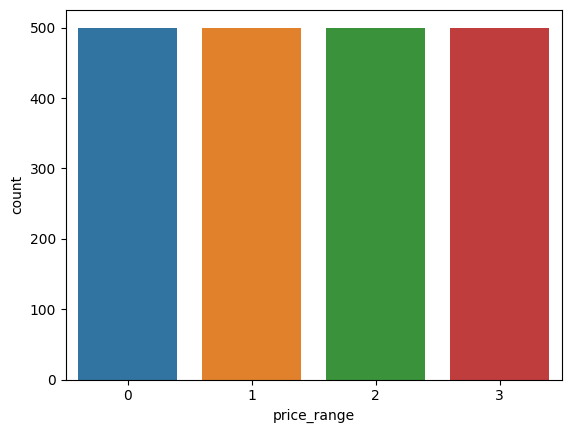

In [ ]:
# Chart - 1 visualization code
sns.countplot(x=m_data['price_range'])

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 2

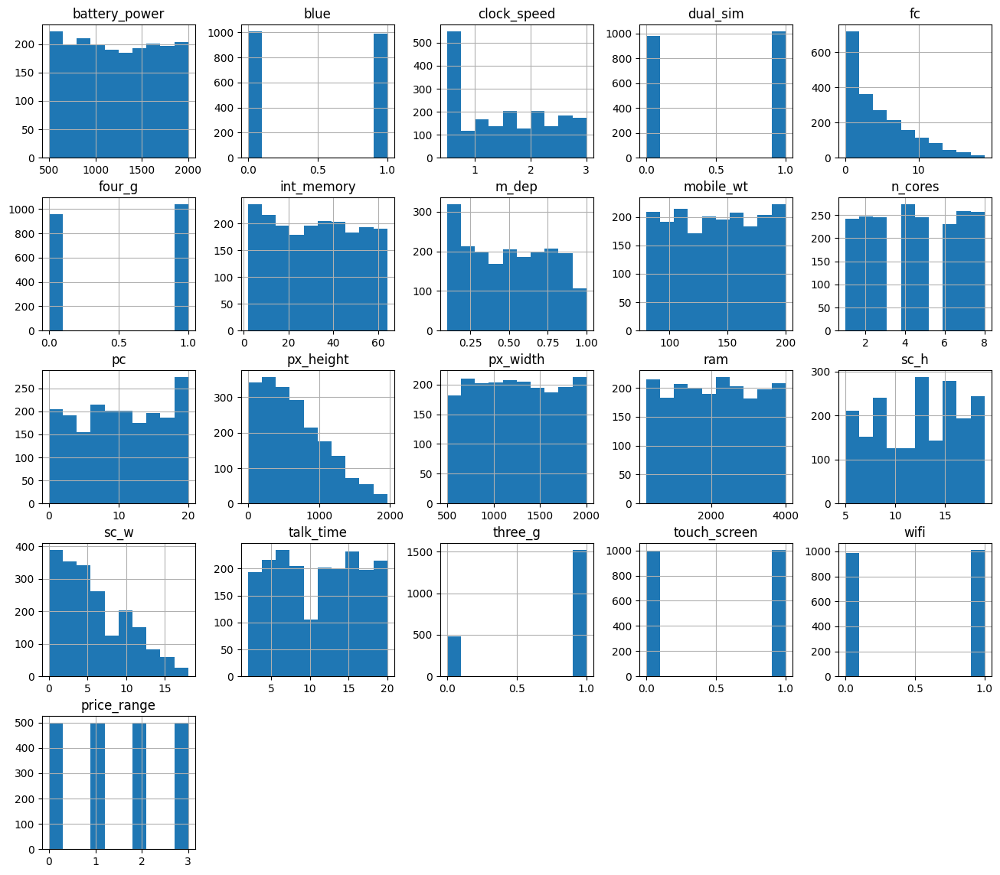

In [ ]:
# Chart - 2 visualization code
hist = m_data.hist(bins=10, figsize=(16,14))

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 3

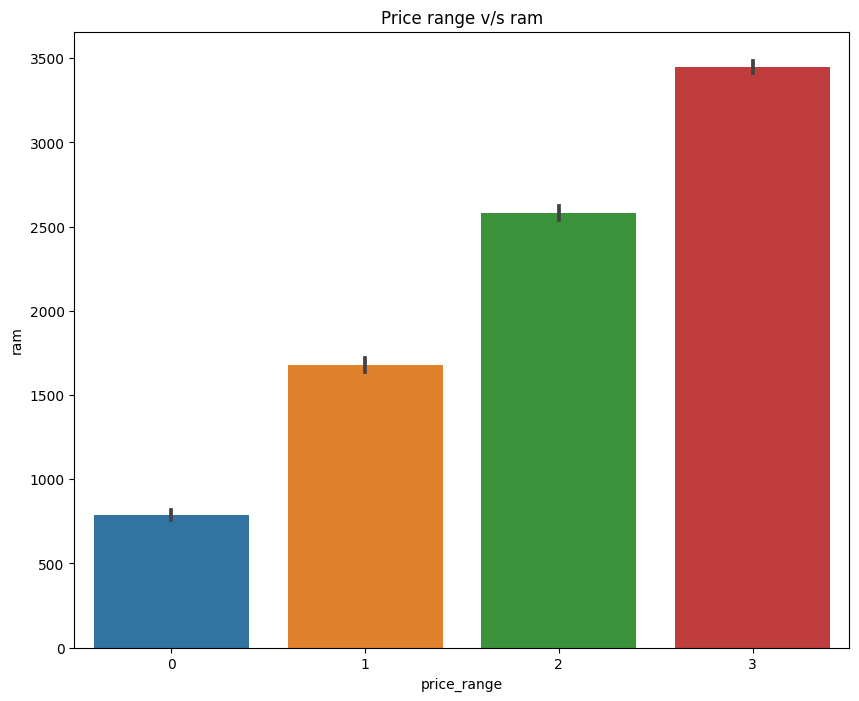

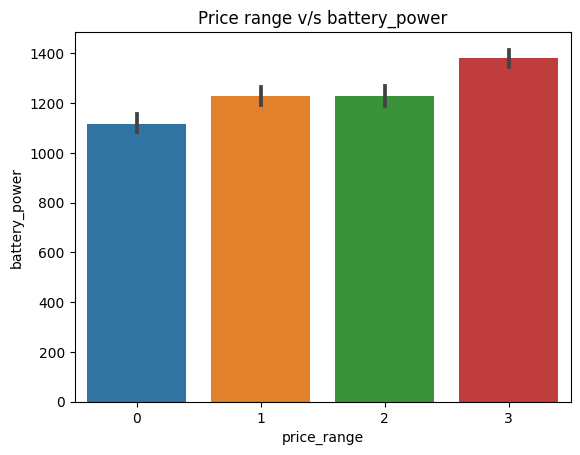

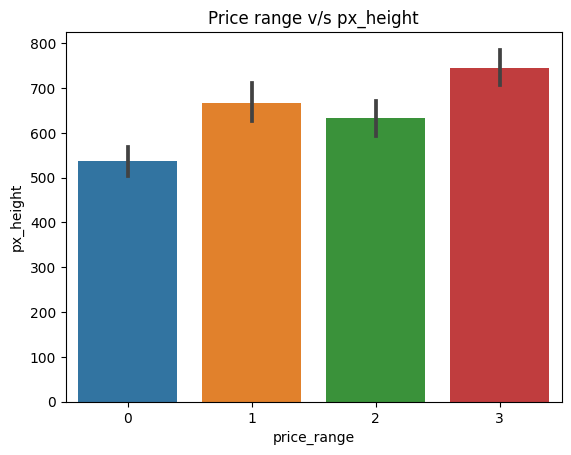

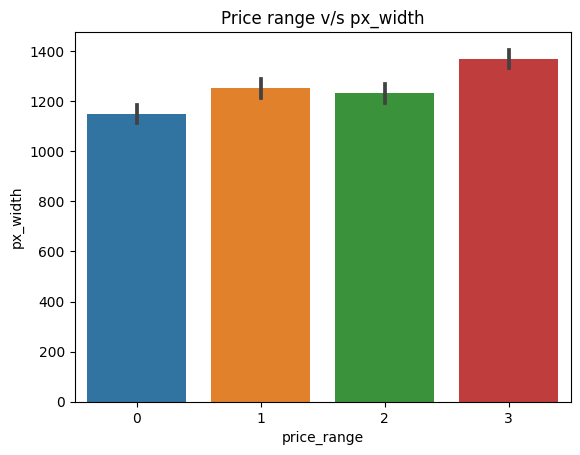

In [ ]:
# Chart - 3 visualization code
# plotting  price_range vs other fearures
plt.figure(figsize=(10,8))

variables=['ram','battery_power','px_height','px_width']
counter=1
for var in variables:
  sns.barplot(x=m_data['price_range'],y=m_data[var])
  plt.title(f'Price range v/s {var}')
  plt.show()
  


##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 4

In [ ]:
# Chart - 4 visualization code
group_by_price=m_data.groupby(['price_range']).agg({'blue':'value_counts','dual_sim':'value_counts','four_g':'value_counts','three_g':'value_counts','touch_screen':'value_counts','wifi':'value_counts'}).unstack()


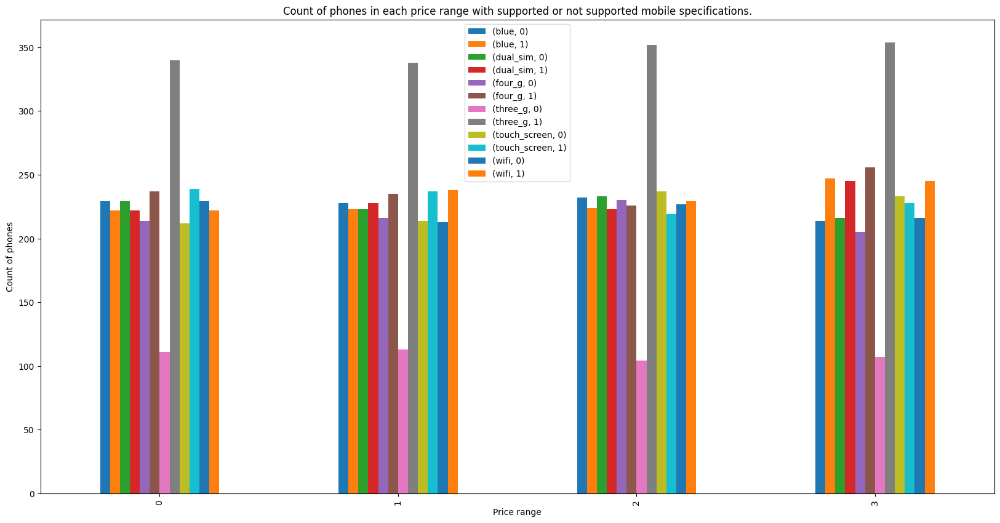

In [ ]:
group_by_price.plot.bar(figsize=(20,10))
plt.title('Count of phones in each price range with supported or not supported mobile specifications.')
plt.xlabel('Price range')
plt.ylabel('Count of phones')
plt.legend(loc='upper center')

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 5

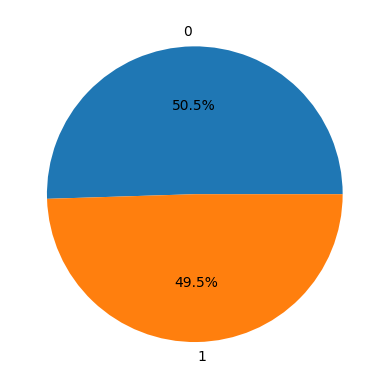

In [ ]:
fig, ax = plt.subplots()
ax.pie(m_data['blue'].value_counts(),labels=('0','1'),autopct='%1.1f%%')
plt.show()

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

##### 3. Will the gained insights help creating a positive business impact? 
Are there any insights that lead to negative growth? Justify with specific reason.

Answer Here

#### Chart - 14 - Correlation Heatmap

<Axes: >

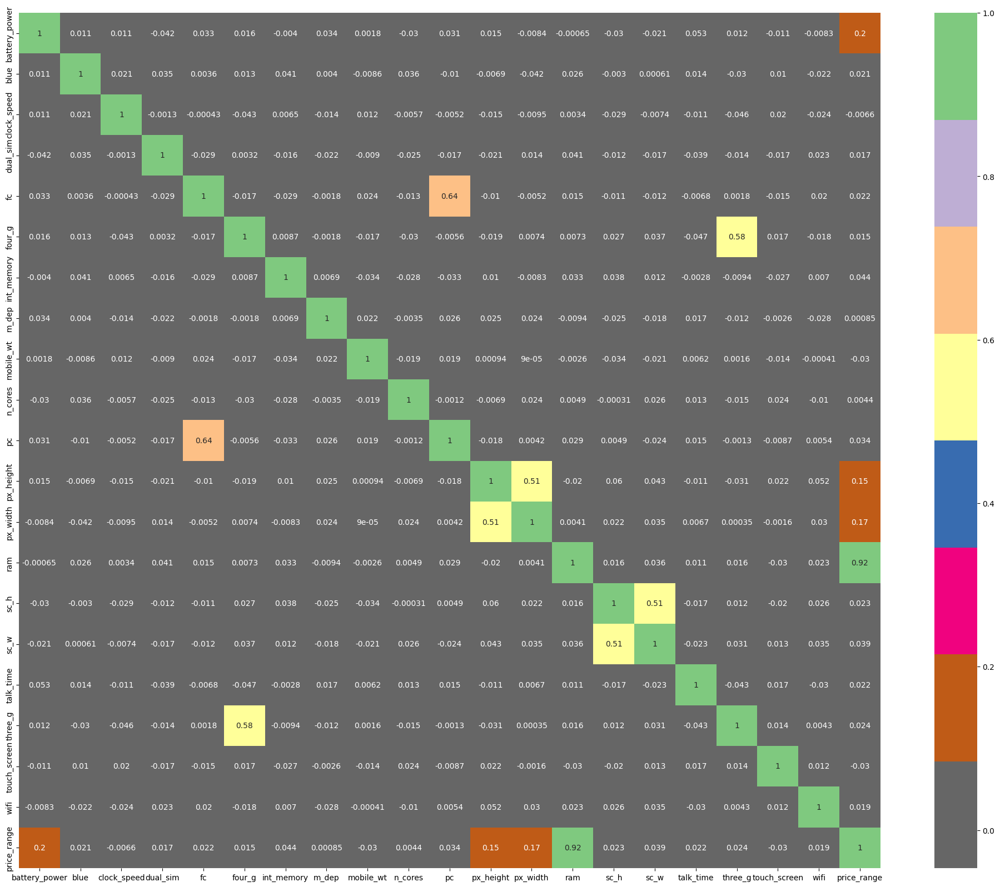

In [ ]:
# Correlation Heatmap visualization code
corr=m_data.corr()
plt.figure(figsize=(25,20))
sns.heatmap(corr,annot=True,cmap=plt.cm.Accent_r)


##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

#### Chart - 15 - Pair Plot 

<Figure size 2500x2000 with 0 Axes>

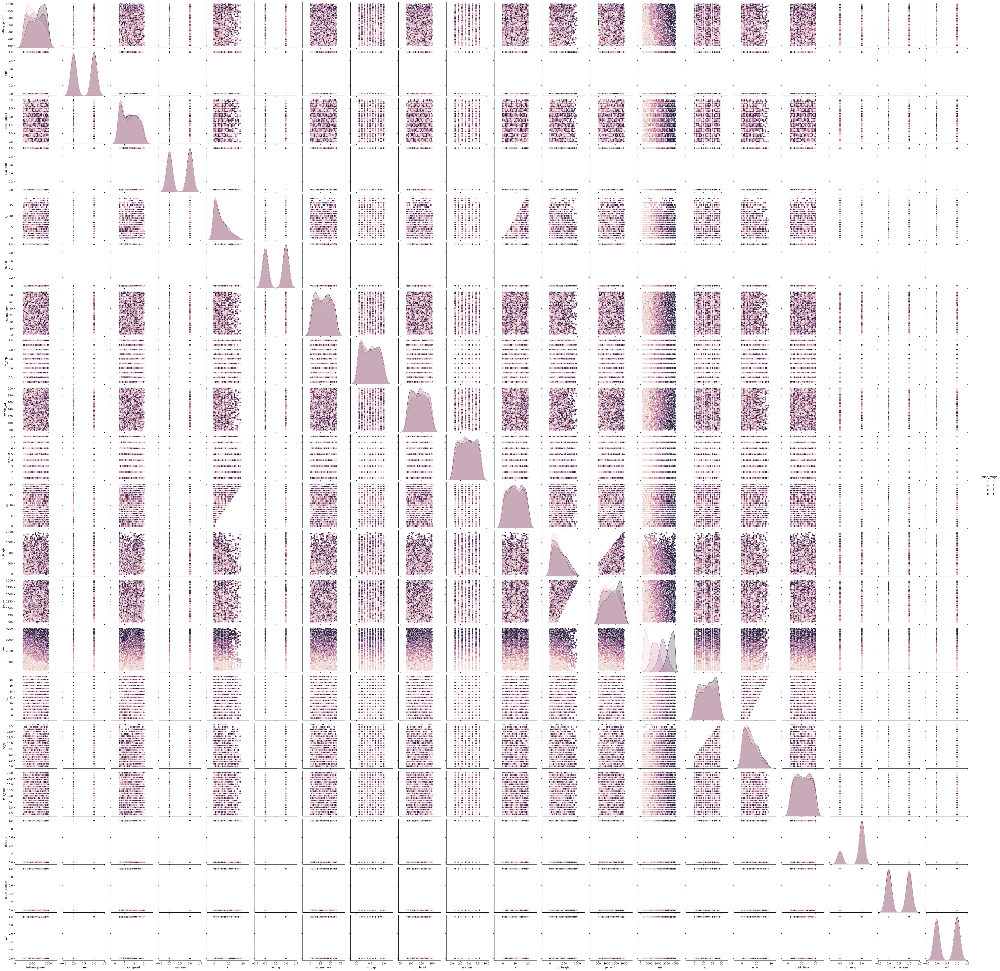

In [ ]:
# Pair Plot visualization code
plt.figure(figsize=(25,20))
sns.pairplot(m_data,hue='price_range')

##### 1. Why did you pick the specific chart?

Answer Here.

##### 2. What is/are the insight(s) found from the chart?

Answer Here

## ***6. Feature Engineering & Data Pre-processing***

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# Manipulate Features to minimize feature correlation and create new features
m_data_c=m_data.copy()

In [ ]:
#making new column for screen size and storing it in cm 
m_data_c['screen_size']= round(np.sqrt(m_data_c['sc_h']**2+m_data_c['sc_w']**2)/2.54,2) #dividing 2.54 for converting inches to cm.

m_data_c['Pixels']=m_data_c['px_height']*m_data_c['px_width']

#### 2. Feature Selection

In [ ]:
# Select your features wisely to avoid overfitting
m_data_c.drop(columns=["sc_h",'sc_w','px_height','px_width'],axis=1,inplace=True)

<Axes: >

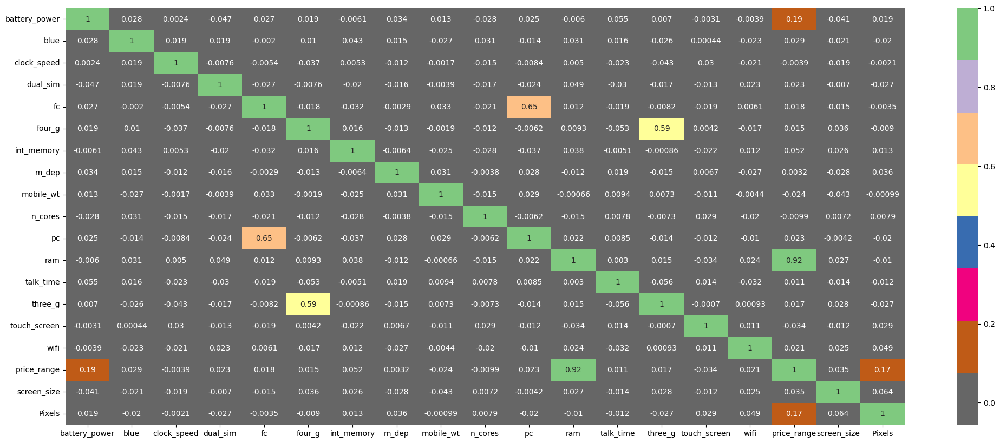

In [ ]:
corr=m_data_c.corr()
plt.figure(figsize=(25,10))
sns.heatmap(corr,annot=True, cmap=plt.cm.Accent_r)

##### What all feature selection methods have you used  and why?

Answer Here.

##### Which all features you found important and why?

Answer Here.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [ ]:
# Transform Your data
# creating the set of dependent and independent variables
X = m_data_c.drop(labels='price_range', axis=1)
Y = m_data_c['price_range']

# print the shape of X and Y
print(f"The shape of X is {X.shape}.")
print(f"The shape of Y is {Y.shape}.")

The shape of X is (1819, 18).
The shape of Y is (1819,).


### 6. Data Scaling

In [ ]:
# Scaling data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

##### Which method have you used to scale you data and why?

### 8. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
X_train, X_test, Y_train, Y_test = train_test_split( X_scaled , Y , test_size = 0.2, random_state = 0)

In [ ]:
print("X_train shape ", X_train.shape)
print("Y_train shape ", Y_train.shape)
print("X_test shape ",X_test.shape)
print("Y_test shape ",Y_test.shape)

X_train shape  (1455, 18)
Y_train shape  (1455,)
X_test shape  (364, 18)
Y_test shape  (364,)


##### What data splitting ratio have you used and why? 

Answer Here.

In [ ]:
#Making function for Confusion matrix
def matrix(actual,predicted):
  labels=['0','1','2','3']
  mat=confusion_matrix(actual,predicted)
  print(mat)

  ax = plt.subplot()
  sns.heatmap(mat, annot=True, ax=ax)

  ax.set_xlabel('Predicted labels')
  ax.set_ylabel('Actual labels')
  ax.set_title('Confusion Matrix')
  ax.xaxis.set_ticklabels(labels)
  ax.yaxis.set_ticklabels(labels)




## ***7. ML Model Implementation***

### ML Model - 1

In [ ]:
# ML Model - 1 Random Forest Classifier
def logistic_regression (X,Y):

  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")
  
  lr_model=LogisticRegression()
  lr_model.fit(X_train,Y_train)

  # Making predictions on train and test data
  train_preds = lr_model.predict(X_train)
  test_preds = lr_model.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = lr_model.predict_proba(X_train)
  test_preds_prob = lr_model.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy = accuracy_score(Y_train,train_preds)
  test_accuracy = accuracy_score(Y_test,test_preds)

  print('\n')
  print("The accuracy on train dataset is", train_accuracy)
  print("The accuracy on test dataset is", test_accuracy)
  print('\n')

  print('\n')
  # calculating precision and recall on the test set
  rf_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", rf_precision)

  rf_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", rf_recall)

  # calculating roc_auc_score on the test set
  rf_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", rf_roc)
  print('\n')

  # training confusion matrix
  print("\n")
  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()

  # testing confusion matrix
  print("\n")
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")

  return test_accuracy,rf_precision,rf_recall,rf_roc



The shape of training set is (1455, 18) (1455,)
The shape of testing set is (364, 18) (364,)




The accuracy on train dataset is 0.9381443298969072
The accuracy on test dataset is 0.9423076923076923




The precision on test dataset is 0.9419049940445509
The recall on test dataset is 0.9423076923076923
The roc auc score on test dataset is 0.9934752320438683




Confusion matrix for train set:
[[343   9   0   0]
 [ 10 330  17   0]
 [  0  18 330  20]
 [  0   0  16 362]]


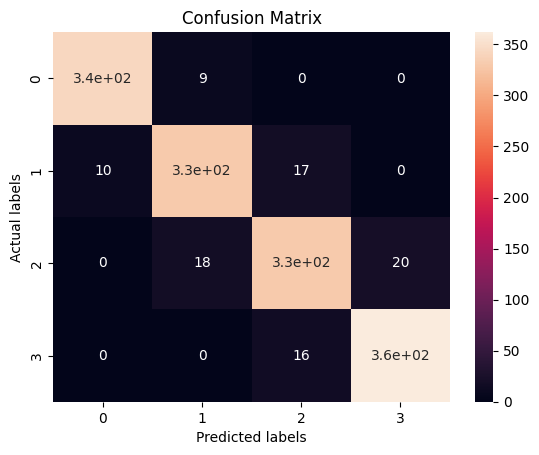

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[99  0  0  0]
 [ 4 88  2  0]
 [ 0  6 77  5]
 [ 0  0  4 79]]


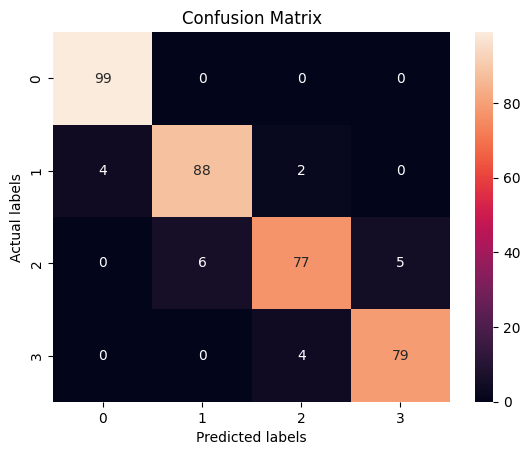

<Figure size 640x480 with 0 Axes>


 Classification report:
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        99
           1       0.94      0.94      0.94        94
           2       0.93      0.88      0.90        88
           3       0.94      0.95      0.95        83

    accuracy                           0.94       364
   macro avg       0.94      0.94      0.94       364
weighted avg       0.94      0.94      0.94       364





In [ ]:
# Fitting data into function
lr=logistic_regression(X_scaled,Y)

### ML Model - 2

In [ ]:
# ML Model - 1 Random Forest Classifier
def random_forest(X,Y):

  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")

  # Number of trees
  n_estimators = [100,200,300]
  
  # Maximum depth of trees
  max_depth = [5,6,7,8,9,10]
  
  # Minimum number of samples required to split a node
  min_samples_split = [5,10,15]
  
  # Minimum number of samples required at each leaf node
  min_samples_leaf = [1,2,3,4,5]
  
  # HYperparameter Grid
  param_dict = {'n_estimators' : n_estimators,
                'max_depth' : max_depth,
                'min_samples_split' : min_samples_split,
                'min_samples_leaf' : min_samples_leaf}
  
  rf_model=RandomForestClassifier()
  
  rf_grid = RandomizedSearchCV(estimator=rf_model,
                       param_distributions = param_dict,
                       cv = 5, verbose=2,scoring='accuracy')
  rf_grid.fit(X_train,Y_train)

  print('\n')
  print(rf_grid.best_estimator_)
  rf_optimal_model = rf_grid.best_estimator_
  print(rf_grid.best_params_)
  print('\n')

  # Making predictions on train and test data
  train_preds = rf_optimal_model.predict(X_train)
  test_preds = rf_optimal_model.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = rf_optimal_model.predict_proba(X_train)
  test_preds_prob = rf_optimal_model.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy = accuracy_score(Y_train,train_preds)
  test_accuracy = accuracy_score(Y_test,test_preds)

  print('\n')
  print("The accuracy on train dataset is", train_accuracy)
  print("The accuracy on test dataset is", test_accuracy)
  print('\n')

  print('\n')
  # calculating precision and recall on the test set
  rf_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", rf_precision)

  rf_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", rf_recall)

  # calculating roc_auc_score on the test set
  rf_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", rf_roc)
  print('\n')

  # training confusion matrix
  print("\n")
  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()

  # testing confusion matrix
  print("\n")
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")

  # Getting plot for feature importance
  features = X_train.columns
  importances = rf_optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='red', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')
  plt.show()

  return test_accuracy,rf_precision,rf_recall,rf_roc



The shape of training set is (1455, 18) (1455,)
The shape of testing set is (364, 18) (364,)


Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=6, min_samples_leaf=5, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=6, min_samples_leaf=5, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=6, min_samples_leaf=5, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=6, min_samples_leaf=5, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=6, min_samples_leaf=5, min_samples_split=5, n_estimators=300; total time=   0.8s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END max_depth=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100; total time=   0.3s
[CV] END max_depth=5, min_samples_leaf=3,

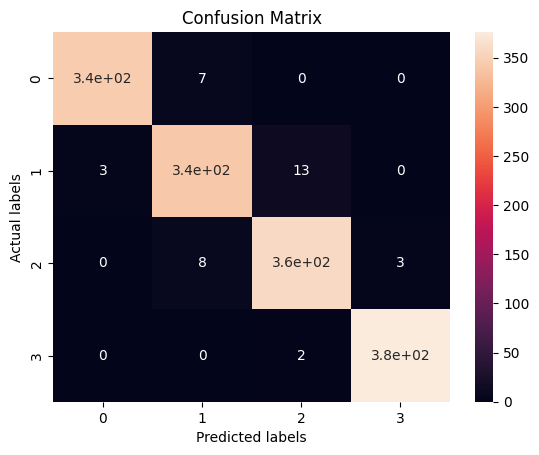

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[94  5  0  0]
 [ 3 79 12  0]
 [ 0 15 62 11]
 [ 0  0  8 75]]


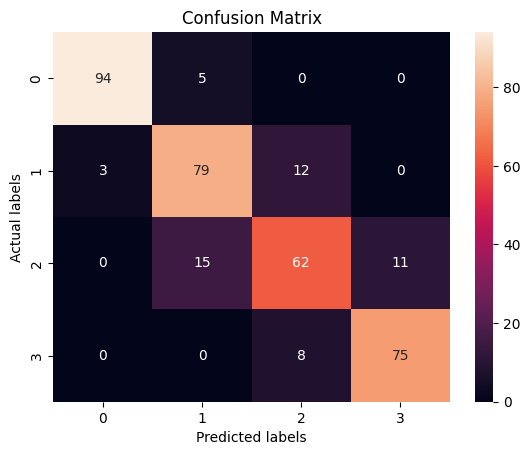

<Figure size 640x480 with 0 Axes>


 Classification report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96        99
           1       0.80      0.84      0.82        94
           2       0.76      0.70      0.73        88
           3       0.87      0.90      0.89        83

    accuracy                           0.85       364
   macro avg       0.85      0.85      0.85       364
weighted avg       0.85      0.85      0.85       364





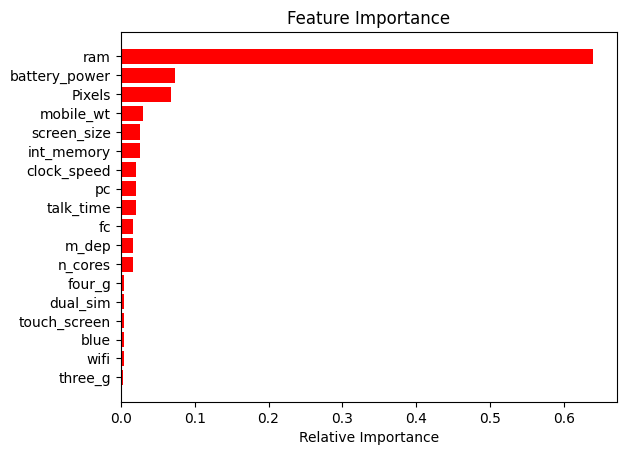

In [ ]:
# Fitting data into function
rf=random_forest(X,Y)

### ML Model - 3

In [ ]:
# ML Model - 1 Greadint Bossting Classifier
def gradinet_boost(X,Y):

  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")

  # Number of trees
  n_estimators = [100,200,300]
  
  # Maximum depth of trees
  max_depth = [5,6,7,8,9,10]
  
  # Minimum number of samples required to split a node
  min_samples_split = [5,10,15]
  
  # Minimum number of samples required at each leaf node
  min_samples_leaf = [1,2,3,4,5]
  
  # HYperparameter Grid
  param_dict = {'n_estimators' : n_estimators,
                'max_depth' : max_depth,
                'min_samples_split' : min_samples_split,
                'min_samples_leaf' : min_samples_leaf,
                'learning_rate': [0.01,0.02,0.05,0.07,0.1]}
  
  gb_model=GradientBoostingClassifier()
  
  gb_grid = RandomizedSearchCV(estimator=gb_model,
                       param_distributions = param_dict,
                       cv = 5, verbose=2,scoring='accuracy')
  gb_grid.fit(X_train,Y_train)

  print('\n')
  print(gb_grid.best_estimator_)
  gb_optimal_model = gb_grid.best_estimator_
  print(gb_grid.best_params_)
  print('\n')

  # Making predictions on train and test data
  train_preds = gb_optimal_model.predict(X_train)
  test_preds = gb_optimal_model.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = gb_optimal_model.predict_proba(X_train)
  test_preds_prob = gb_optimal_model.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy_gb = accuracy_score(Y_train,train_preds)
  test_accuracy_gb = accuracy_score(Y_test,test_preds)

  
  print("The accuracy on train dataset is", train_accuracy_gb)
  print("The accuracy on test dataset is", test_accuracy_gb)
  print('\n')

  
  # calculating precision and recall on the test set
  gb_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", gb_precision)

  gb_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", gb_recall)

  # calculating roc_auc_score on the test set
  gb_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", gb_roc)
  print('\n')

  # training confusion matrix
  
  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()
  print("\n")

  # testing confusion matrix
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()
  print("\n")

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")

  # Getting plot for feature importance
  features = X_train.columns
  importances = gb_optimal_model.feature_importances_
  indices = np.argsort(importances)

  plt.title('Feature Importance')
  plt.barh(range(len(indices)), importances[indices], color='red', align='center')
  plt.yticks(range(len(indices)), [features[i] for i in indices])
  plt.xlabel('Relative Importance')
  plt.show()

  return test_accuracy_gb,gb_precision,gb_recall,gb_roc



In [ ]:
gb_model=gradinet_boost(X,Y)

### ML Model - 4

In [ ]:
# ML Model - 3 KNN
def KNN(X,Y):

  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")
  
  # HYperparameter Grid
  param_grid = {
    'n_neighbors': np.arange(1,31),  # Range of k values
    'weights': ['uniform', 'distance'],  # Weighting method
    'metric': ['euclidean', 'manhattan'] }
  
  knn_model=KNeighborsClassifier()

  knn_grid = GridSearchCV(knn_model,param_grid,scoring='accuracy',cv=5)
  knn_grid.fit(X_train,Y_train)

  print('\n')
  print(knn_grid.best_estimator_)
  knn_optimal_model = knn_grid.best_estimator_
  print(knn_grid.best_params_)
  print('\n')

  # Making predictions on train and test data
  train_preds = knn_optimal_model.predict(X_train)
  test_preds = knn_optimal_model.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = knn_optimal_model.predict_proba(X_train)
  test_preds_prob = knn_optimal_model.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy_knn = knn_optimal_model.score(X_train,Y_train)
  test_accuracy_knn = knn_optimal_model.score(X_test,Y_test)

  
  print("The accuracy on train dataset is", train_accuracy_knn)
  print("The accuracy on test dataset is", test_accuracy_knn)
  print('\n')

  
  # calculating precision and recall on the test set
  knn_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", knn_precision)

  knn_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", knn_recall)

  # calculating roc_auc_score on the test set
  knn_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", knn_roc)
  print('\n')

  # training confusion matrix
  
  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()
  print("\n")

  # testing confusion matrix
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()
  print("\n")

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")


  return test_accuracy_knn,knn_precision,knn_recall,knn_roc




The shape of training set is (1455, 18) (1455,)
The shape of testing set is (364, 18) (364,)




KNeighborsClassifier(metric='manhattan', n_neighbors=27, weights='distance')
{'metric': 'manhattan', 'n_neighbors': 27, 'weights': 'distance'}


The accuracy on train dataset is 1.0
The accuracy on test dataset is 0.6098901098901099


The precision on test dataset is 0.605540699609391
The recall on test dataset is 0.6098901098901099
The roc auc score on test dataset is 0.8502155180130379


Confusion matrix for train set:
[[352   0   0   0]
 [  0 357   0   0]
 [  0   0 368   0]
 [  0   0   0 378]]


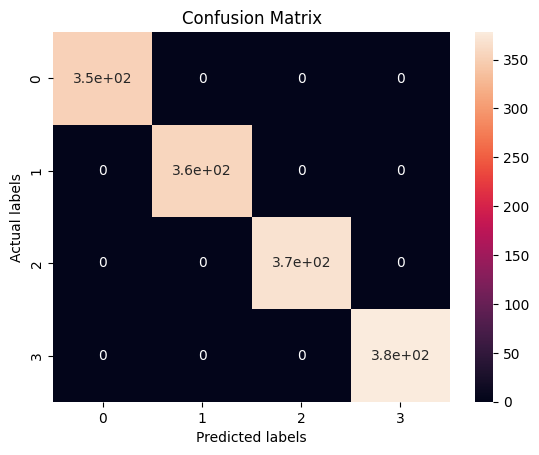

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[84 12  3  0]
 [19 38 31  6]
 [ 3 27 40 18]
 [ 0  0 23 60]]


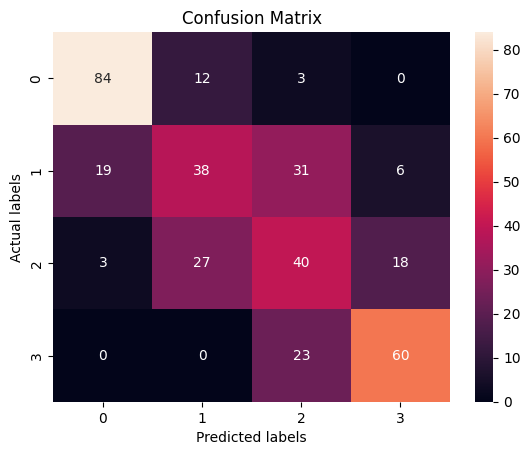

<Figure size 640x480 with 0 Axes>




 Classification report:
              precision    recall  f1-score   support

           0       0.79      0.85      0.82        99
           1       0.49      0.40      0.44        94
           2       0.41      0.45      0.43        88
           3       0.71      0.72      0.72        83

    accuracy                           0.61       364
   macro avg       0.60      0.61      0.60       364
weighted avg       0.61      0.61      0.61       364





In [ ]:
knn_model=KNN(X_scaled,Y)

In [ ]:
knn = KNeighborsClassifier(n_neighbors=9)


In [ ]:
knn.fit(X_test,Y_test)

KNeighborsClassifier(n_neighbors=9)

In [ ]:
y_pred=knn.predict(X_train)

In [ ]:
accuracy_score(Y_train,y_pred)

0.46804123711340206

In [ ]:
def KNN(X,Y):
  # split the data into train and test set
  X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
  print("The shape of training set is", X_train.shape, Y_train.shape)
  print("The shape of testing set is", X_test.shape, Y_test.shape)
  print("\n")

  knn = KNeighborsClassifier()
  param_grid = {'n_neighbors':np.arange(1,31)}
  knn_cv= GridSearchCV(knn,param_grid,cv=5)
  knn_cv.fit(X,Y)

  print('\n')
  print(knn_cv.best_score_)
  knn_optimal_model = knn_cv.best_estimator_
  print(knn_cv.best_params_)
  print('\n')

  # Making predictions on train and test data
  train_preds = knn_optimal_model.predict(X_train)
  test_preds = knn_optimal_model.predict(X_test)

  # Get the probabilities on train and test
  train_preds_prob = knn_optimal_model.predict_proba(X_train)
  test_preds_prob = knn_optimal_model.predict_proba(X_test)

  #getting accuracy socre for model
  train_accuracy_knn = knn_optimal_model.score(X_train,Y_train)
  test_accuracy_knn = knn_optimal_model.score(X_test,Y_test)

  
  print("The accuracy on train dataset is", train_accuracy_knn)
  print("The accuracy on test dataset is", test_accuracy_knn)
  print('\n')

  
  # calculating precision and recall on the test set
  knn_precision = precision_score(Y_test, test_preds, average='weighted')
  print("The precision on test dataset is", knn_precision)

  knn_recall = recall_score(Y_test, test_preds, average='weighted')
  print("The recall on test dataset is", knn_recall)

  # calculating roc_auc_score on the test set
  knn_roc = roc_auc_score(Y_test, test_preds_prob, multi_class='ovo', average='weighted')
  print("The roc auc score on test dataset is", knn_roc)
  print('\n')

  # training confusion matrix
  
  print("Confusion matrix for train set:")
  matrix(Y_train,train_preds)
  plt.figure()
  plt.show()
  print("\n")

  # testing confusion matrix
  print("Confusion matrix for test set:")
  matrix(Y_test,test_preds)
  plt.figure()
  plt.show()
  print("\n")

  # getting classification report
  print("\n Classification report:")
  print(classification_report(Y_test, test_preds))
  print("\n")

  return test_accuracy_knn,knn_precision,knn_recall,knn_roc






The shape of training set is (1455, 18) (1455,)
The shape of testing set is (364, 18) (364,)




0.41616262525353437
{'n_neighbors': 1}


The accuracy on train dataset is 1.0
The accuracy on test dataset is 1.0


The precision on test dataset is 1.0
The recall on test dataset is 1.0
The roc auc score on test dataset is 1.0


Confusion matrix for train set:
[[352   0   0   0]
 [  0 357   0   0]
 [  0   0 368   0]
 [  0   0   0 378]]


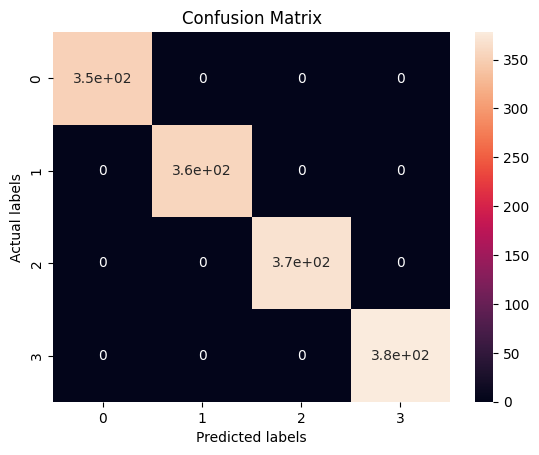

<Figure size 640x480 with 0 Axes>



Confusion matrix for test set:
[[99  0  0  0]
 [ 0 94  0  0]
 [ 0  0 88  0]
 [ 0  0  0 83]]


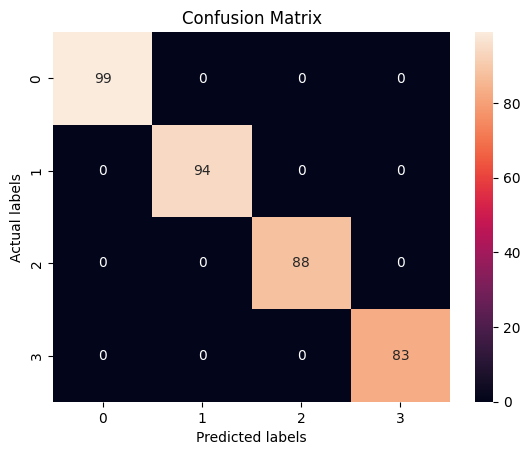

<Figure size 640x480 with 0 Axes>




 Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        99
           1       1.00      1.00      1.00        94
           2       1.00      1.00      1.00        88
           3       1.00      1.00      1.00        83

    accuracy                           1.00       364
   macro avg       1.00      1.00      1.00       364
weighted avg       1.00      1.00      1.00       364





(1.0, 1.0, 1.0, 1.0)

In [ ]:
KNN(X,Y)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

Answer Here.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

Answer Here.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

Answer Here.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

Write the conclusion here.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***